In [1]:
!pip3 install scikit-image


[notice] A new release of pip is available: 24.1.1 -> 24.3.1
[notice] To update, run: python3.12 -m pip install --upgrade pip


In [2]:
import os
import time
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from torchvision import models
import pandas as pd
import numpy as np
from skimage import io

# Paths to your panda and rat datasets
panda_path = '/Users/na/Machine Learning Assignment/Assignment-4/images/panda'
rat_path = '/Users/na/Machine Learning Assignment/Assignment-4/images/rat'

transform_basic = transforms.Compose([
    transforms.Resize((200, 200)),  # VGG16 and VGG19 expect 200x200 images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

transform_augmented = transforms.Compose([
    transforms.Resize((200, 200)),
    transforms.RandomHorizontalFlip(),
    # transforms.RandomRotation(10),
    transforms.RandomAffine(degrees=20, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

class CustomDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.labels = labels
        self.transform = transform
        # if transform:
        #     self.images = self.transform(images)
        # else:
        self.images = images

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        label = self.labels[idx]
        if self.transform:
            img = self.transform(img)
            # self.images = self.transform(self.images)
        return np.array(img).astype(float), np.array(label).astype(float)

# Function to load and preprocess the dataset
def load_images_and_labels(panda_path, rat_path):
    images = []
    labels = []
    for img_name in os.listdir(panda_path):
        img_path = os.path.join(panda_path, img_name)
        img = io.imread(img_path)
        img = img / 255.0  # Normalize the image
        images.append(img)
        labels.append(0)  # Label for panda

    for img_name in os.listdir(rat_path):
        img_path = os.path.join(rat_path, img_name)
        img = io.imread(img_path)
        img = img / 255.0  # Normalize the image
        images.append(img)
        labels.append(1)  # Label for rat

    return images, labels

# Load all images and labels
images, labels = load_images_and_labels(panda_path, rat_path)

# Encode labels (panda = 0, rat = 1)
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)

# Split the dataset into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(images, encoded_labels, test_size=0.2, random_state=42)

# X_train, X_test, y_train, y_test = np.array(X_train), np.array(X_test), np.array(y_train), np.array(y_test)

# Create train and test datasets and loaders for basic
train_dataset = CustomDataset(X_train, y_train, transform=transform_basic)
test_dataset = CustomDataset(X_test, y_test, transform=transform_basic)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

#for augmented
train_dataset_augmented = CustomDataset(X_train, y_train, transform=transform_augmented)
test_dataset_augmented = CustomDataset(X_test, y_test, transform=transform_augmented)

train_loader_augmented = DataLoader(train_dataset_augmented, batch_size=32, shuffle=True)
test_loader_augmented = DataLoader(test_dataset_augmented, batch_size=32, shuffle=False)

# train_dataset.images = transform_basic(train_dataset.images)


In [3]:
from torch.utils.data import ConcatDataset

# Combine the original and augmented datasets
combined_train_dataset = ConcatDataset([train_dataset, train_dataset_augmented])
combined_test_dataset = ConcatDataset([test_dataset, test_dataset_augmented])

# Create data loaders for the combined datasets
combined_train_loader = DataLoader(combined_train_dataset, batch_size=16, shuffle=True)
combined_test_loader = DataLoader(combined_test_dataset, batch_size=16, shuffle=True)

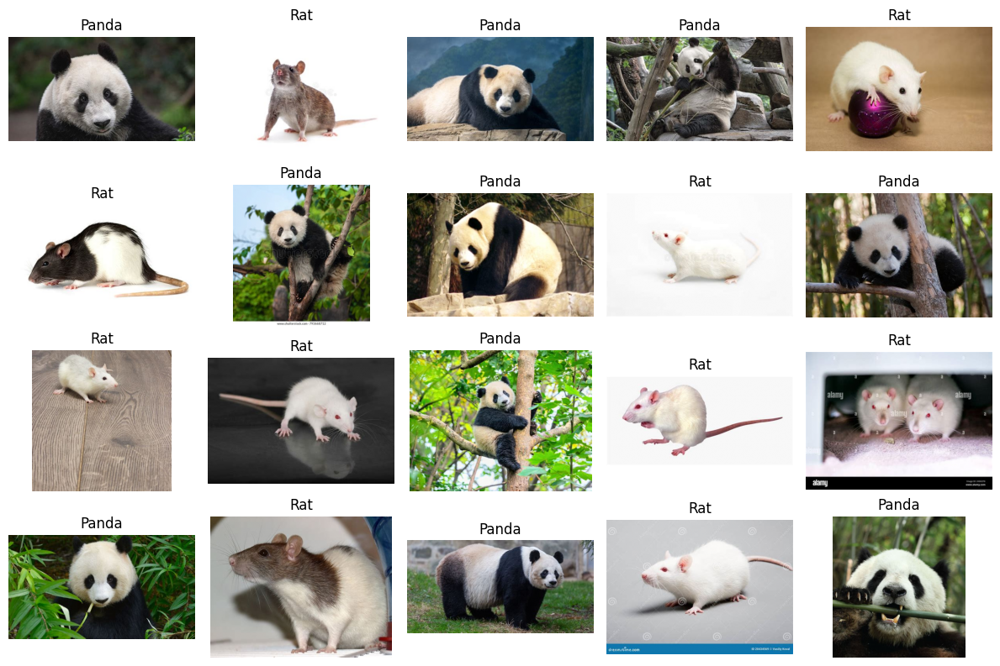

In [4]:
import matplotlib.pyplot as plt
import numpy as np

# Sample 20 images and labels from the dataset
sample_images = combined_train_dataset.datasets[0].images
sample_labels = combined_train_dataset.datasets[0].labels

# Define the grid size
rows, cols = 4, 5
fig, axes = plt.subplots(rows, cols, figsize=(12, 8))

for i, ax in enumerate(axes.flat):
    # Extract the image and label for each subplot
    image = sample_images[i]
    label = 'Panda' if sample_labels[i] == 0 else 'Rat'
    
    # Display the image and set the title to the label
    ax.imshow(image)
    ax.set_title(label)
    ax.axis('off')  # Hide axes ticks

plt.tight_layout()
plt.show()


In [5]:
print(len(combined_train_dataset.datasets[0].images))
print(len(combined_train_dataset.datasets[0].labels))
print(len(combined_train_dataset.datasets[1].labels))

160
160
160


In [ ]:
class VGG1Block(nn.Module):
    def __init__(self):
        super(VGG1Block, self).__init__()
        self.conv_layer = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32,
                      kernel_size=3, padding=1),
            nn.ReLU(),
        )
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.flatten = nn.Flatten()
        self.fc_layers = nn.Sequential(
            nn.Linear(32 * 100 * 100, 128),
            nn.ReLU(),
            nn.Linear(128, 1),
            # nn.Sigmoid()
        )

    def forward(self, x):
        x = self.conv_layer(x)
        x = self.maxpool(x)
        x = self.flatten(x)
        x = self.fc_layers(x)
        return nn.functional.sigmoid(x)

In [ ]:
class VGG3Block(nn.Module):
  def __init__(self):
    super(VGG3Block,self).__init__()
    self.conv_layer1 = nn.Sequential(
        nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1),
        nn.ReLU(),
    )
    self.maxpool1 = nn.MaxPool2d(kernel_size=2, stride=2)

    self.conv_layer2 = nn.Sequential(
        nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1),  # Changed in_channels to 32
        nn.ReLU(),
    )
    self.maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)

    self.conv_layer3 = nn.Sequential(
        nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1),  # Changed in_channels to 64
        nn.ReLU(),
    )
    self.maxpool3 = nn.MaxPool2d(kernel_size=2, stride=2)

    self.flatten = nn.Flatten()
    self.fc_layers = nn.Sequential(
        nn.Linear(128 * 25 * 25, 128),  # Adjusted the flattened size
        nn.ReLU(),
        nn.Linear(128, 1),
    )

  def forward(self, x):
      x = self.conv_layer1(x)
      x = self.maxpool1(x)
      x = self.conv_layer2(x)
      x = self.maxpool2(x)
      x = self.conv_layer3(x)
      x = self.maxpool3(x)
      x = self.flatten(x)
      x = self.fc_layers(x)
      return nn.functional.sigmoid(x)

In [ ]:
class TransferLearningAllLayers(nn.Module):
    def __init__(self):
        super(TransferLearningAllLayers, self).__init__()
        self.base_model = models.vgg16(pretrained=True)
        self.classifier = nn.Sequential(
            nn.Linear(1000, 128),  # Adjust input features to match your final conv layer output
            nn.ReLU(inplace=True),
            nn.Linear(128, 16),
            nn.ReLU(inplace=True),
            nn.Linear(16, 1)
        )

    def forward(self, x):
        x = self.base_model(x)
        x = self.classifier(x)
        return nn.functional.sigmoid(x)

In [ ]:
class TransferLearningFinalMLP(nn.Module):
    def __init__(self):
        super(TransferLearningFinalMLP, self).__init__()
        self.base_model = models.vgg16(pretrained=True)
        for param in self.base_model.parameters():
            param.requires_grad = False  # Freeze convolution layers
        self.classifier = nn.Sequential(
            nn.Linear(1000, 128),  # Adjust input features to match your final conv layer output
            nn.ReLU(inplace=True),
            nn.Linear(128, 16),
            nn.ReLU(inplace=True),
            nn.Linear(16, 1)
        )  # Change final layer to match output classes

    def forward(self, x):
        x = self.base_model(x)
        x = self.classifier(x)
        return nn.functional.sigmoid(x)

In [10]:
def image_plot_20(dataset_to_plot, model, input_size = 200, use_gpu=False):
    # Sample 20 images and labels from the dataset
    device = torch.device(use_gpu if use_gpu and torch.cuda.is_available() else "cpu")
    sample_images = dataset_to_plot.dataset.images
    sample_labels = dataset_to_plot.dataset.labels

    # Define the grid size
    rows, cols = 4, 5
    fig, axes = plt.subplots(rows, cols, figsize=(18, 8))

    for i, ax in enumerate(axes.flat):
        # Extract the image and label for each subplot
        image = sample_images[i]
        input = torch.tensor(image, dtype=torch.float32).to(device=device)
        input = input.permute(2, 0, 1).unsqueeze(0)
        resize = nn.AdaptiveAvgPool3d([3,input_size,input_size])
        input = resize(input)
        output = model(input)
        preds = float(output[0][0]) >0
        predicted_label = 'Panda' if preds==0 else 'Rat'
        label = 'Panda' if sample_labels[i] == 0 else 'Rat'
        final_label = "Predicted: "+predicted_label+" | Actual Label: "+ label

        # Display the image and set the title to the label
        ax.imshow(image)
        ax.set_title(final_label)
        ax.axis('off')  # Hide axes ticks

    plt.tight_layout()
    plt.show()

In [ ]:
from torch.utils.tensorboard import SummaryWriter

def train_and_evaluate(model, train_loader, test_loader, input_size,num_epochs=5,lr=0.001,use_gpu=False, fileName=None):
    device = torch.device(use_gpu if use_gpu and torch.cuda.is_available() else "cpu")
    model.to(device)
    writer = SummaryWriter(f"./{fileName}")

    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    loss = 0
    # Training
    start_time = time.time()
    total_steps = 0
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0
        for i in range(len(train_loader.dataset.images)):
            inputs = train_loader.dataset.images[i]
            # inputs = inputs.astype(np.float32)
            labels = torch.tensor([train_loader.dataset.labels[i]]).to(device)
            inputs = torch.tensor(inputs,dtype=torch.float32).to(device)
            # print(type(inputs))
            inputs = inputs.permute(2, 0, 1).unsqueeze(0)
            resize = nn.AdaptiveAvgPool3d([3,input_size,input_size])
            inputs = resize(inputs)
            optimizer.zero_grad()
            # print(type(inputs))
            outputs = model(inputs)
            loss = criterion(outputs[0], labels.float())
            loss.backward()
            optimizer.step()

            running_loss += float(loss)
            total_steps+=1

            writer.add_scalar("Training Loss", running_loss*100/total_steps, global_step = total_steps)
            # print(outputs[0][0])
            preds = float(outputs[0][0]) >0
            # preds = torch.tensor(preds).to(device)

            correct_train += (preds == labels).sum().item()
            total_train += labels.size(0)
            train_acc = correct_train*100/total_train
            writer.add_scalar("Training Accuracy", correct_train*100/total_train, global_step = total_steps)

            model.eval()
            correct_test = 0
            total_test = 0

            with torch.no_grad():
                for i in range(len(test_loader.dataset.images)):
                    inputs = test_loader.dataset.images[i]
                    # inputs = inputs.astype(np.float32)
                    labels = torch.tensor([test_loader.dataset.labels[i]]).to(device)
                    inputs = torch.tensor(inputs, dtype=torch.float32).to(device)

                    inputs = inputs.permute(2, 0, 1).unsqueeze(0)
                    resize = nn.AdaptiveAvgPool3d([3,input_size,input_size])
                    inputs = resize(inputs)

                    logits = model(inputs)
                    preds = logits > 0
                    correct_test += (preds == labels.view_as(preds)).sum().item()
                    total_test += labels.size(0)

            test_acc = 100 * correct_test / total_test
            writer.add_scalar("Testing Accuracy", test_acc, global_step = total_steps)

            # print("loss at step-",i, "is",loss)
            if (((i+1) % 10 == 0) & ((i+1)//10 > 0)):
                print(f"Epoch: {epoch + 1}/{num_epochs} | Step: {total_steps} | Training Loss: {running_loss / total_steps} | Training Accuracy: {train_acc} | Testing Accuracy: {test_acc}")

        # print("loss at epoch-",epoch, "is",loss)

    training_time = time.time() - start_time

    # Evaluation
    

    correct_train = 0
    total_train = 0
    with torch.no_grad():
        for i in range(len(train_loader.dataset.images)):
            inputs = train_loader.dataset.images[i]
            # inputs = inputs.astype(np.float32)
            labels = torch.tensor([train_loader.dataset.labels[i]]).to(device)
            inputs = torch.tensor(inputs, dtype=torch.float32).to(device)
            inputs = inputs.permute(2, 0, 1).unsqueeze(0)
            resize = nn.AdaptiveAvgPool3d([3,input_size,input_size])
            inputs = resize(inputs)
            outputs = model(inputs)
            predicted = float(outputs[0][0])>0
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

    train_accuracy = 100 * correct_train / total_train

    correct_test = 0
    total_test = 0
    with torch.no_grad():
        for i in range(len(test_loader.dataset.images)):
            inputs = test_loader.dataset.images[i]
            # inputs = inputs.astype(np.float32)
            labels = torch.tensor([test_loader.dataset.labels[i]]).to(device)
            inputs = torch.tensor(inputs, dtype=torch.float32).to(device)
            inputs = inputs.permute(2, 0, 1).unsqueeze(0)
            resize = nn.AdaptiveAvgPool3d([3,input_size,input_size])
            inputs = resize(inputs)
            outputs = model(inputs)
            predicted = float(outputs[0][0])>0
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()

    testing_accuracy = 100 * correct_test / total_test

    #  number of parameters
    num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    image_plot_20(test_loader,model, input_size=input_size, use_gpu=use_gpu)
    return training_time, loss, train_accuracy, testing_accuracy, num_params, model

# Define models
models_to_evaluate = [
    ("VGG (1 block)", VGG1Block()),
    ("VGG (3 blocks)", VGG3Block()),
    ("VGG (3 blocks) with augmented data", VGG3Block()),
    ("Transfer Learning (All Layers)", TransferLearningAllLayers()),
    ("Transfer Learning (Final MLP)", TransferLearningFinalMLP())
]

# Evaluate each model
results = []
trained_models = []

# for model_name, model in models_to_evaluate:
#     print("Model Name:", model_name)
#     training_time, train_loss, train_acc, test_acc, num_params, model_output = train_and_evaluate(model, train_loader, test_loader, input_size=200, num_epochs=10, lr=0.001, use_gpu="mps", fileName=model_name)
#     # model_output
#     trained_models.append(model_output)
#     results.append({
#         "Model": model_name,
#         "Training Time": training_time,
#         "Training Loss": train_loss,
#         "Training Accuracy": train_acc,
#         "Testing Accuracy": test_acc,
#         "Number of Model Parameters": num_params
#     })

# Print the results as a table
# df = pd.DataFrame(results)
# print(df)

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


### VGG16 (1 block)

Epoch: 1/6 | Step: 1 | Training Loss: 0.724335253238678 | Training Accuracy: 0.0 | Testing Accuracy: 52.5
Epoch: 1/6 | Step: 2 | Training Loss: 28.23602893948555 | Training Accuracy: 0.0 | Testing Accuracy: 52.5
Epoch: 1/6 | Step: 3 | Training Loss: 18.824065387248993 | Training Accuracy: 33.333333333333336 | Testing Accuracy: 42.5
Epoch: 1/6 | Step: 4 | Training Loss: 14.672639027237892 | Training Accuracy: 25.0 | Testing Accuracy: 65.0
Epoch: 1/6 | Step: 5 | Training Loss: 11.760287304222583 | Training Accuracy: 40.0 | Testing Accuracy: 80.0
Epoch: 1/6 | Step: 6 | Training Loss: 9.835840097318092 | Training Accuracy: 50.0 | Testing Accuracy: 60.0
Epoch: 1/6 | Step: 7 | Training Loss: 8.61221956461668 | Training Accuracy: 42.857142857142854 | Testing Accuracy: 72.5
Epoch: 1/6 | Step: 8 | Training Loss: 7.550590657629073 | Training Accuracy: 50.0 | Testing Accuracy: 52.5
Epoch: 1/6 | Step: 9 | Training Loss: 7.684896701739894 | Training Accuracy: 44.44444444444444 | Testing Accuracy: 8

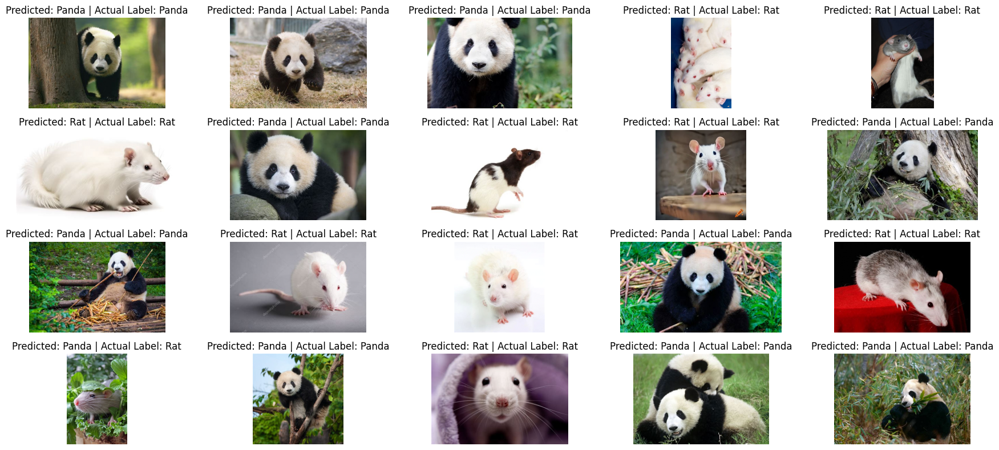

In [12]:
training_time, train_loss, train_acc, test_acc, num_params, model_output = train_and_evaluate(VGG1Block(), train_loader, test_loader, input_size=200, num_epochs=6, lr=0.001, use_gpu="mps", fileName="TestRuns/VGG1")
# model_output
trained_models.append(model_output)
results.append({
    "Model": "VGG16 (1 Block)",
    "Training Time": training_time,
    "Training Loss": train_loss,
    "Training Accuracy": train_acc,
    "Testing Accuracy": test_acc,
    "Number of Model Parameters": num_params
})

### VGG (3 blocks)

Epoch: 1/6 | Step: 1 | Training Loss: 0.691027820110321 | Training Accuracy: 100.0 | Testing Accuracy: 52.5
Epoch: 1/6 | Step: 2 | Training Loss: 2.655691474676132 | Training Accuracy: 50.0 | Testing Accuracy: 52.5
Epoch: 1/6 | Step: 3 | Training Loss: 1.9424107472101848 | Training Accuracy: 66.66666666666667 | Testing Accuracy: 47.5
Epoch: 1/6 | Step: 4 | Training Loss: 1.6394275426864624 | Training Accuracy: 50.0 | Testing Accuracy: 52.5
Epoch: 1/6 | Step: 5 | Training Loss: 1.4812634229660033 | Training Accuracy: 40.0 | Testing Accuracy: 72.5
Epoch: 1/6 | Step: 6 | Training Loss: 1.3489740490913391 | Training Accuracy: 50.0 | Testing Accuracy: 42.5
Epoch: 1/6 | Step: 7 | Training Loss: 1.273991414478847 | Training Accuracy: 42.857142857142854 | Testing Accuracy: 52.5
Epoch: 1/6 | Step: 8 | Training Loss: 1.2197367250919342 | Training Accuracy: 37.5 | Testing Accuracy: 82.5
Epoch: 1/6 | Step: 9 | Training Loss: 1.1466053989198473 | Training Accuracy: 44.44444444444444 | Testing Accur

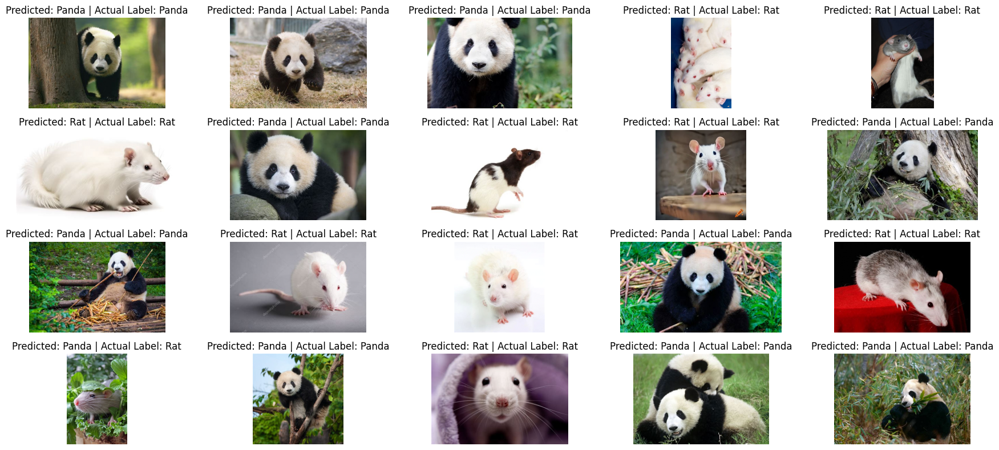

In [13]:
training_time, train_loss, train_acc, test_acc, num_params, model_output = train_and_evaluate(VGG3Block(), train_loader, test_loader, input_size=200, num_epochs=6, lr=0.001, use_gpu="mps", fileName="TestRuns/VGG3")
# model_output
trained_models.append(model_output)
results.append({
    "Model": "VGG16 (3 Block)",
    "Training Time": training_time,
    "Training Loss": train_loss,
    "Training Accuracy": train_acc,
    "Testing Accuracy": test_acc,
    "Number of Model Parameters": num_params
})

In [14]:
import numpy as np
import cv2
import random

def augment_image(image):
    # Resize the image to (200, 200)
    # image = cv2.resize(image, (200, 200))
    
    # Random Horizontal Flip
    if random.random() > 0.5:
        image = cv2.flip(image, 1)  # Flip horizontally
    
    # Random Affine Transformation
    if random.random() > 0.5:
        rows, cols, ch = image.shape
        # Generate random affine transformation matrix
        center = (cols // 2, rows // 2)
        angle = random.uniform(-20, 20)  # Random rotation angle
        scale = 1.0  # No scaling
        M = cv2.getRotationMatrix2D(center, angle, scale)
        
        # Random translation
        tx = random.uniform(-0.1 * cols, 0.1 * cols)
        ty = random.uniform(-0.1 * rows, 0.1 * rows)
        M[:, 2] += [tx, ty]
        
        # Apply affine transformation
        image = cv2.warpAffine(image, M, (cols, rows), borderMode=cv2.BORDER_REFLECT)
    
    # Normalize the image to match torchvision's normalize
    # mean = np.array([0.485, 0.456, 0.406])
    # std = np.array([0.229, 0.224, 0.225])
    # image = image / 255.0  # Scale pixel values to [0, 1]
    # image = (image - mean) / std  # Normalize
    
    return image
# array_ = np.array(train_dataset.images)
# print(array_.shape)
# train_dataset.images = augment_image(array_)



In [15]:
for i in range(len(train_loader_augmented.dataset.images)):
    train_loader_augmented.dataset.images[i] = augment_image(train_loader_augmented.dataset.images[i])
for i in range(len(test_loader_augmented.dataset.images)):
    test_loader_augmented.dataset.images[i] = augment_image(test_loader_augmented.dataset.images[i])

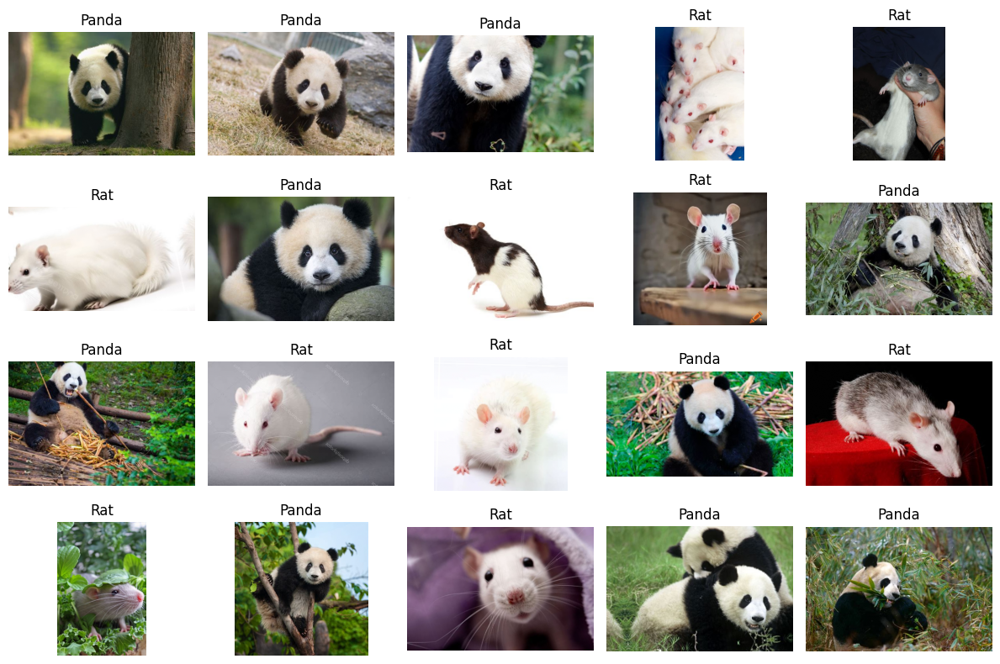

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import random

# Sample 20 images and labels from the dataset
sample_images = test_loader_augmented.dataset.images
sample_labels = test_loader_augmented.dataset.labels

# Define the grid size
rows, cols = 4, 5
fig, axes = plt.subplots(rows, cols, figsize=(12, 8))

for i, ax in enumerate(axes.flat):
    # Extract the image and label for each subplot
    image = sample_images[i]
    # image = cv2.flip(image, 1)
    # rows, cols, ch = image.shape
    # # Generate random affine transformation matrix
    # center = (cols // 2, rows // 2)
    # angle = random.uniform(-20, 20)  # Random rotation angle
    # scale = 1.0  # No scaling
    # M = cv2.getRotationMatrix2D(center, angle, scale)
    
    # # Random translation
    # tx = random.uniform(-0.1 * cols, 0.1 * cols)
    # ty = random.uniform(-0.1 * rows, 0.1 * rows)
    # M[:, 2] += [tx, ty]
    
    # # Apply affine transformation
    # image = cv2.warpAffine(image, M, (cols, rows), borderMode=cv2.BORDER_REFLECT)
    label = 'Panda' if sample_labels[i] == 0 else 'Rat'
    
    # Display the image and set the title to the label
    ax.imshow(image)
    ax.set_title(label)
    ax.axis('off')  # Hide axes ticks

plt.tight_layout()
plt.show()


### VGG (3 blocks) with augmented data

Epoch: 1/6 | Step: 1 | Training Loss: 0.7217546701431274 | Training Accuracy: 0.0 | Testing Accuracy: 52.5
Epoch: 1/6 | Step: 2 | Training Loss: 2.8257415890693665 | Training Accuracy: 0.0 | Testing Accuracy: 52.5
Epoch: 1/6 | Step: 3 | Training Loss: 2.033049742380778 | Training Accuracy: 33.333333333333336 | Testing Accuracy: 77.5
Epoch: 1/6 | Step: 4 | Training Loss: 1.6929285675287247 | Training Accuracy: 50.0 | Testing Accuracy: 72.5
Epoch: 1/6 | Step: 5 | Training Loss: 1.503649353981018 | Training Accuracy: 40.0 | Testing Accuracy: 77.5
Epoch: 1/6 | Step: 6 | Training Loss: 1.3615784843762715 | Training Accuracy: 50.0 | Testing Accuracy: 65.0
Epoch: 1/6 | Step: 7 | Training Loss: 1.260251181466239 | Training Accuracy: 57.142857142857146 | Testing Accuracy: 82.5
Epoch: 1/6 | Step: 8 | Training Loss: 1.166498214006424 | Training Accuracy: 62.5 | Testing Accuracy: 72.5
Epoch: 1/6 | Step: 9 | Training Loss: 1.1022157669067383 | Training Accuracy: 66.66666666666667 | Testing Accuracy

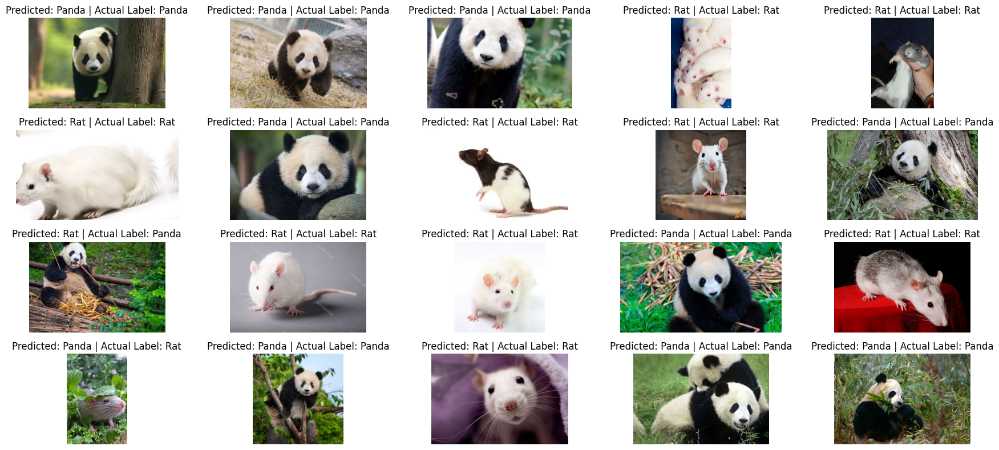

In [19]:
training_time, train_loss, train_acc, test_acc, num_params, model_output = train_and_evaluate(VGG3Block(), train_loader_augmented, test_loader_augmented, input_size=200, num_epochs=6, lr=0.001, use_gpu="mps", fileName="TestRuns/VGG3A")
# model_output
trained_models.append(model_output)
results.append({
    "Model": "VGG16 (3 Block) with augmented data",
    "Training Time": training_time,
    "Training Loss": train_loss,
    "Training Accuracy": train_acc,
    "Testing Accuracy": test_acc,
    "Number of Model Parameters": num_params
})

### Transfer Learning (All Layers) on VGG16

Epoch: 1/2 | Step: 1 | Training Loss: 0.7375248670578003 | Training Accuracy: 0.0 | Testing Accuracy: 77.5
Epoch: 1/2 | Step: 2 | Training Loss: 0.7188374698162079 | Training Accuracy: 0.0 | Testing Accuracy: 77.5
Epoch: 1/2 | Step: 3 | Training Loss: 0.7119777798652649 | Training Accuracy: 0.0 | Testing Accuracy: 80.0
Epoch: 1/2 | Step: 4 | Training Loss: 0.6859617829322815 | Training Accuracy: 25.0 | Testing Accuracy: 77.5
Epoch: 1/2 | Step: 5 | Training Loss: 0.693127167224884 | Training Accuracy: 20.0 | Testing Accuracy: 80.0
Epoch: 1/2 | Step: 6 | Training Loss: 0.6949610908826193 | Training Accuracy: 16.666666666666668 | Testing Accuracy: 80.0
Epoch: 1/2 | Step: 7 | Training Loss: 0.6736081498009818 | Training Accuracy: 28.571428571428573 | Testing Accuracy: 85.0
Epoch: 1/2 | Step: 8 | Training Loss: 0.6714388877153397 | Training Accuracy: 37.5 | Testing Accuracy: 87.5
Epoch: 1/2 | Step: 9 | Training Loss: 0.6734480592939589 | Training Accuracy: 44.44444444444444 | Testing Accura

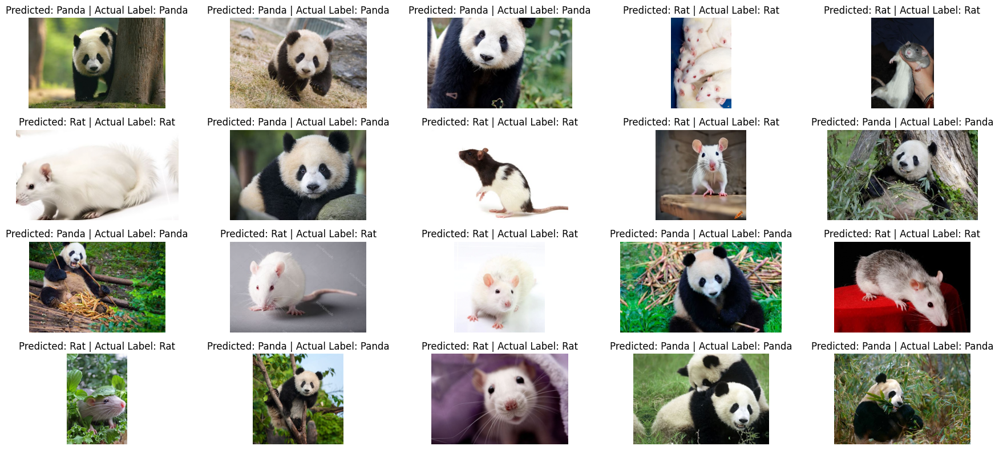

In [20]:
training_time, train_loss, train_acc, test_acc, num_params, model_output = train_and_evaluate(TransferLearningAllLayers(), train_loader, test_loader, input_size=224, num_epochs=2, lr=0.00001, use_gpu="mps", fileName="TestRuns/TransferLearningVGG16All")
# model_output
trained_models.append(model_output)
results.append({
    "Model": "Transfer Learning (All Layers) on VGG16",
    "Training Time": training_time,
    "Training Loss": train_loss,
    "Training Accuracy": train_acc,
    "Testing Accuracy": test_acc,
    "Number of Model Parameters": num_params
})

### Transfer learning using VGG16 with tuning only final MLP layers (excluding convolution layers)

Epoch: 1/2 | Step: 1 | Training Loss: 0.6965616345405579 | Training Accuracy: 0.0 | Testing Accuracy: 40.0
Epoch: 1/2 | Step: 2 | Training Loss: 0.8092018067836761 | Training Accuracy: 0.0 | Testing Accuracy: 57.5
Epoch: 1/2 | Step: 3 | Training Loss: 0.7298311591148376 | Training Accuracy: 33.333333333333336 | Testing Accuracy: 62.5
Epoch: 1/2 | Step: 4 | Training Loss: 0.7164230793714523 | Training Accuracy: 50.0 | Testing Accuracy: 62.5
Epoch: 1/2 | Step: 5 | Training Loss: 0.7236101627349854 | Training Accuracy: 40.0 | Testing Accuracy: 75.0
Epoch: 1/2 | Step: 6 | Training Loss: 0.7189640700817108 | Training Accuracy: 33.333333333333336 | Testing Accuracy: 87.5
Epoch: 1/2 | Step: 7 | Training Loss: 0.7050885472978864 | Training Accuracy: 42.857142857142854 | Testing Accuracy: 95.0
Epoch: 1/2 | Step: 8 | Training Loss: 0.6730349361896515 | Training Accuracy: 50.0 | Testing Accuracy: 97.5
Epoch: 1/2 | Step: 9 | Training Loss: 0.6685394710964627 | Training Accuracy: 55.55555555555556 

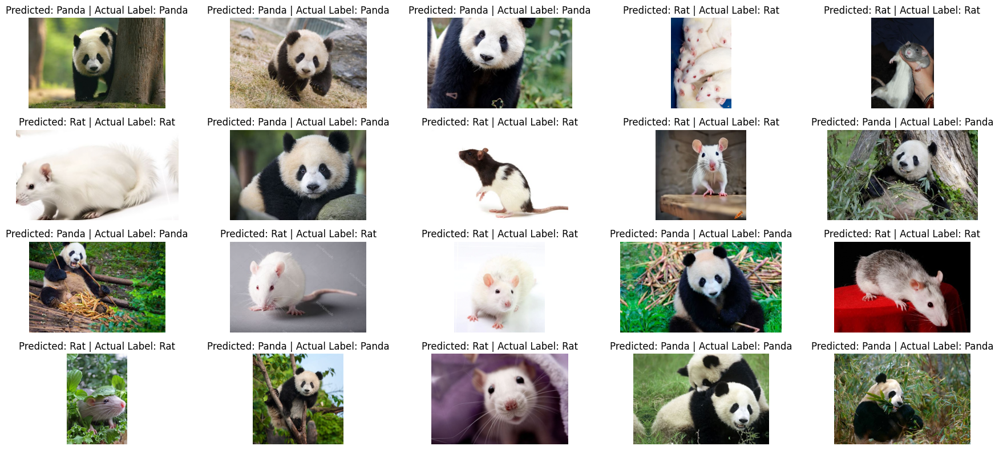

In [21]:
training_time, train_loss, train_acc, test_acc, num_params, model_output = train_and_evaluate(TransferLearningFinalMLP(), train_loader, test_loader, input_size=224, num_epochs=2, lr=0.0001, use_gpu="mps", fileName="TestRuns/TransferLearningVGG16FinalMLP")
# model_output
trained_models.append(model_output)
results.append({
    "Model": "Transfer Learning (All Layers) on VGG16 tuning final MLP layer",
    "Training Time": training_time,
    "Training Loss": train_loss,
    "Training Accuracy": train_acc,
    "Testing Accuracy": test_acc,
    "Number of Model Parameters": num_params
})

In [29]:
import pandas as pd
# print(pd.DataFrame(results))
# results.pop(2)
model_name = []
training_time = []
training_loss = []
training_accuracy = []
testing_accuracy = []
no_parameters = []

# results
for i in range(5):
    model_name.append(results[i]['Model'])
    training_time.append(results[i]['Training Time'])
    training_loss.append(float(results[i]['Training Loss']))
    training_accuracy.append(results[i]['Training Accuracy'])
    testing_accuracy.append(results[i]['Testing Accuracy'])
    no_parameters.append(results[i]['Number of Model Parameters'])

metrics = (pd.DataFrame({'Model Name': model_name, 'Training Time': training_time, 'Training Loss': training_loss, 'Training Accuracy': training_accuracy, 'Testing Accuracy': testing_accuracy, 'Number of Model Parameters': no_parameters}))
metrics
    

,Model Name,Training Time,Training Loss,Training Accuracy,Testing Accuracy,Number of Model Parameters
0,VGG16 (1 Block),415.499092,0.000004,100.000,97.5,40961153
1,VGG16 (3 Block),390.189785,0.015015,99.375,97.5,10333505
2,VGG16 (3 Block) with augmented data,345.535105,0.000655,99.375,90.0,10333505
3,Transfer Learning (All Layers) on VGG16,1452.632188,0.000028,100.000,100.0,138487753
4,Transfer Learning (All Layers) on VGG16 tuning...,1386.860813,0.000922,99.375,100.0,130209


In [31]:
!pip3 install tensorboard


[notice] A new release of pip is available: 24.1.1 -> 24.3.1
[notice] To update, run: python3.12 -m pip install --upgrade pip


#### Are the results as expected? Why or why not?

yes, the results are expected becuase transfer learning is giving better results as it uses pretrained VGG as basis. Augmented data yields a bit less result showing that our model is less trained for images where objects are rotated and flipped abnormally. Further training it would yield better results and model would be better than above 2

#### Does data augmentation help? Why or why not?

Yes, Data Augmentation helps because it helps you deal with images where objects are not directly visible. In natural scenarios, images may be rotated, flipped, etc. angles may be changed of photograph. If a model is properly trained in augmented dataset, it yields better results than normal ones.

#### Does it matter how many epochs you fine-tune the model? Why or why not?

Yes, the number of epochs for fine-tuning does matter, as it can impact both overfitting and convergence. If fine-tuning continues for too many epochs, the model may start to overfit on the training set, resulting in reduced generalization and lower testing accuracy. Conversely, insufficient fine-tuning might lead to underfitting, where the model doesn’t learn enough from the data. Balancing epochs is crucial, particularly for transfer learning models.

#### Are there any particular images that the model is confused about? Why or why not?

As we can see an image in every image plot there is an image of mouse in the bottom left corner which is misclassified in vgg1block and vgg3block. It is because mouse has leaf on his head which covers larger part of it. and face is barely and improperly visible

In [71]:
# trained_models[-1]

for i in range(len(trained_models)):
    print(trained_models[2])
    torch.save(trained_models[i].state_dict(), f'/Users/na/Machine Learning Assignment/Assignment-4/models/{i}.pth')
# print(len(trained_models))

VGG3Block(
  (conv_layer1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
  )
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_layer2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
  )
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_layer3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
  )
  (maxpool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc_layers): Sequential(
    (0): Linear(in_features=80000, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=1, bias=True)
  )
)
VGG3Block(
  (conv_layer1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
 